# Differential abundance analysis 

In [1]:
DATA_DIR = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/'
fig_save_path = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/figures/'

In [2]:
#Thomas Walle modified from:
# Differential abundance analysis with Milo in python
#Author:** Emma Dann
#Date:** 16/10/2020
#use this under conda environment 2021_Peer_Milo_jupyter_2

# import packages + setup

In [3]:
# Before importing diffxpy.api or batchglm.api in your python session, execute:
#for de testing use 2022_Peer_Ganesh_CRC environment
import os
os.environ.setdefault("TF_NUM_THREADS", "1")
os.environ.setdefault("TF_LOOP_PARALLEL_ITERATIONS", "1")

'1'

In [ ]:
#custom library
from scrnaseq_preprocessing_utils import *

In [4]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import scipy.sparse as sparse
import matplotlib.pyplot as plt
import seaborn as sns
from kneed import KneeLocator





In [5]:
import rpy2.rinterface_lib.callbacks
import logging
import anndata2ri

In [6]:
color_map_clusters_nogrey = ["#FFFF00", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

batlow_20 = ['#1d2356','#1d2b59',
'#14375e',
'#134460',
'#1c5261',
'#235f5f',
'#396a58',
'#4c714e',
'#607843',
'#757e36',
'#8d8532',
'#a78b30',
'#c49138',
'#dc954d',
'#f09c6a',
'#f8a487',
'#f8aca2',
'#f8b5be',
'#f8c2d9',
'#eecbe1'] 
import random
random.seed(1)
random.shuffle(batlow_20)

    
blue_red = ['#DE2A1B','#1B2ADE',"#1CE6FF", ]
#scanpy layout
sc.set_figure_params(scanpy=True, dpi=400, dpi_save=400, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=True, ipython_format='png2x')
sns.set_style('white')
sc.settings.verbosity = 3

SPADE_ann_1_dict = {'B_GC':batlow_20[0],
 'B_memory':batlow_20[2],
 'B_naive':batlow_20[4],
 'CD4_T':batlow_20[6],
 'CD8_T':batlow_20[8],
 'DC':batlow_20[10],
 'ILC3':batlow_20[12],
 'MDC':batlow_20[14],
 'NK':batlow_20[16],
 'Treg':batlow_20[17],
 'gdT':batlow_20[18],
 'mast':batlow_20[19],
 'pDC':batlow_20[3],
 'plasma':batlow_20[1]}

In [9]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

Activate the anndata2ri conversion between SingleCellExperiment and AnnData

In [10]:
anndata2ri.activate()

Loading the `rpy2` extension enables cell magic to be used. This runs R code in jupyter notebook cells.

In [11]:
%load_ext rpy2.ipython

### Milo set-up

Milo requires r-base=4.1 in conda. Then install milo from Bioconductor

In [12]:
#%%R
#if (!requireNamespace("BiocManager", quietly = TRUE))
#    install.packages("BiocManager")

#BiocManager::install("miloR")

In [13]:
%%R
library(miloR)
library(igraph)

# Differential abundance testing

## data paths and sample metadata

In [14]:
adata_path = DATA_DIR+'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_raw_filtered_clustered_drops_annotated_nodrops_log1p_clustered_leukocytes_scran_annotated_clustered_imputed_hvgenes_andmarker_15000_clustered_imputed_v2_210501_annotated_211208.h5ad'
adata_neigh_save_path = DATA_DIR + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_M_reembedded_neigh_prevson_NEE_interaction_NRfold.h5ad'
adata_neigh_save_path_2 = DATA_DIR + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_M_reembedded_neigh_prevson_NEE_interaction_NRfold_2.h5ad'
adata_save_path = DATA_DIR + 'BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_M_reembedded_prevson_NEE_interaction_NRfold.h5ad'

recalculate_embeddings = True
subset_adata = True
subset = 'MDC'
subset_patients = False
patient_subset_obs = 'Bassez_expansion'
#patient_subset_obs = 'Bassez_timepoint'
patient_subset_key = 'NE'
#indicate the samples you want to analyze
subset_list = ['Metastasis','Primary']

reverse_fc = True

indicate sample processing time as a confounding variable (only for perturbation experiments!
does not make sense as a confounder for differences between stages bc stages had to be isolated at different 
timepoints

## prepare data

In [15]:
adata_path

'/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_raw_filtered_clustered_drops_annotated_nodrops_log1p_clustered_leukocytes_scran_annotated_clustered_imputed_hvgenes_andmarker_15000_clustered_imputed_v2_210501_annotated_211208.h5ad'

In [16]:
#read h5ad file
adata = sc.read(adata_path)
adata

AnnData object with n_obs × n_vars = 97863 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:01:35)


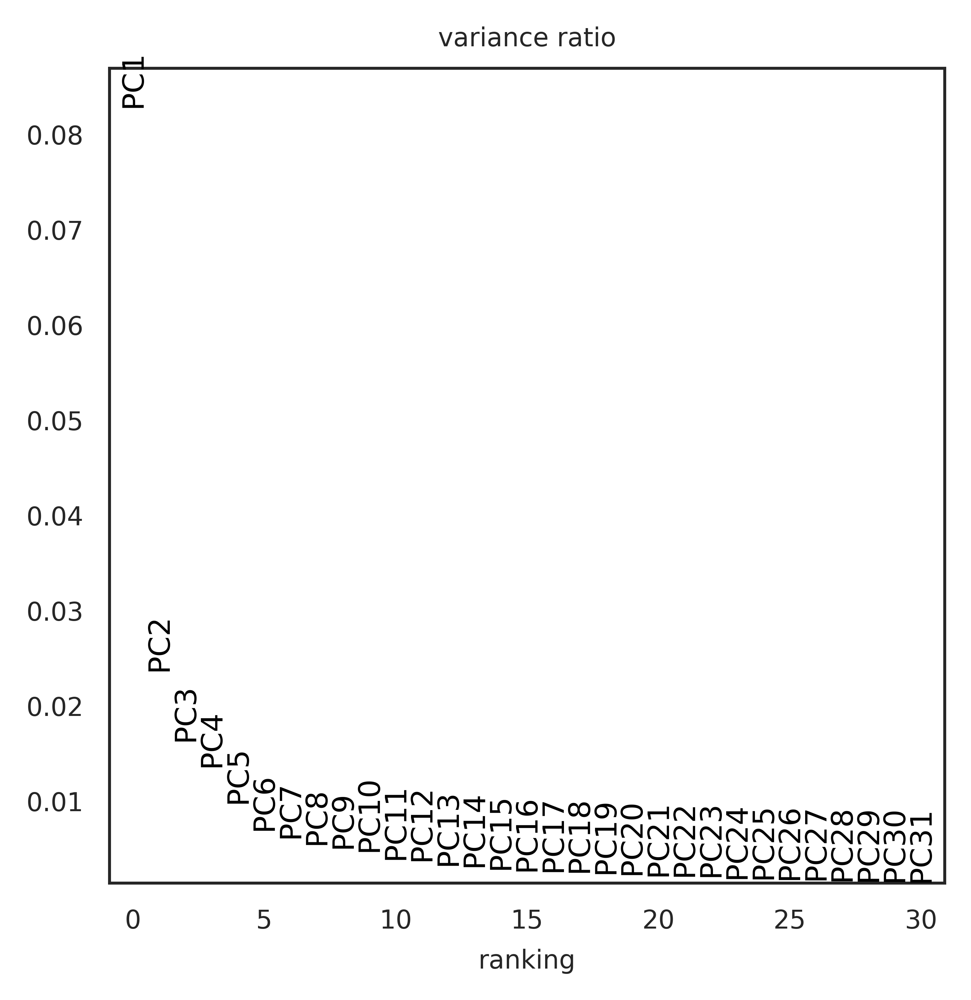

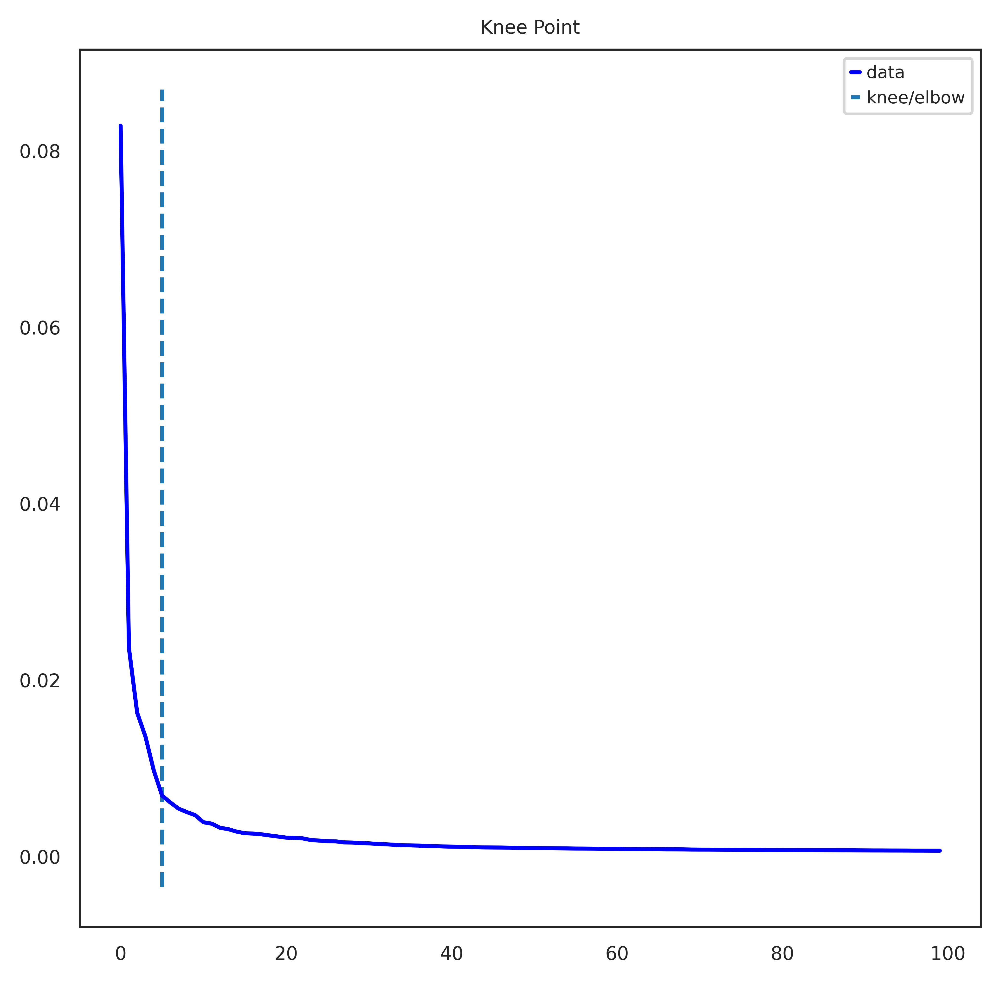

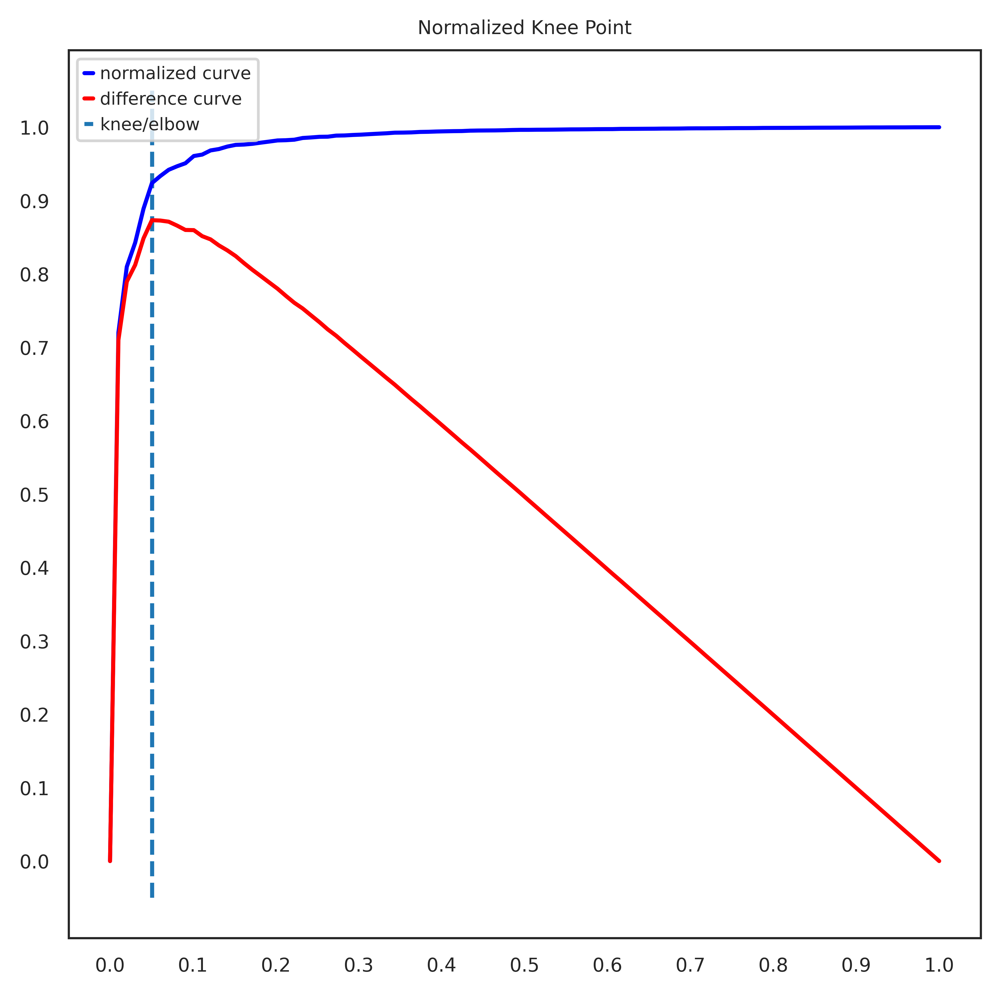

Kneepoint happens at PC: 5
5 PC explain 14.606830134496796 % of variance
2 PC explain 10.646165687959032 % of variance
3 PC explain 12.273190379498576 % of variance
4 PC explain 13.630700208320393 % of variance
5 PC explain 14.606830134496796 % of variance
6 PC explain 15.297214081388312 % of variance
7 PC explain 15.908478812162643 % of variance
8 PC explain 16.449639795166892 % of variance
9 PC explain 16.951344750856695 % of variance
10 PC explain 17.418996734227925 % of variance
11 PC explain 17.805799654195916 % of variance
12 PC explain 18.176589088836803 % of variance
13 PC explain 18.500767921495154 % of variance
14 PC explain 18.80939606675366 % of variance
15 PC explain 19.090371451297308 % of variance
16 PC explain 19.35243689368761 % of variance
17 PC explain 19.610830367288724 % of variance
18 PC explain 19.86095844300889 % of variance
19 PC explain 20.098103590298745 % of variance
20 PC explain 20.32312816771213 % of variance
21 PC explain 20.535518948017454 % of variance

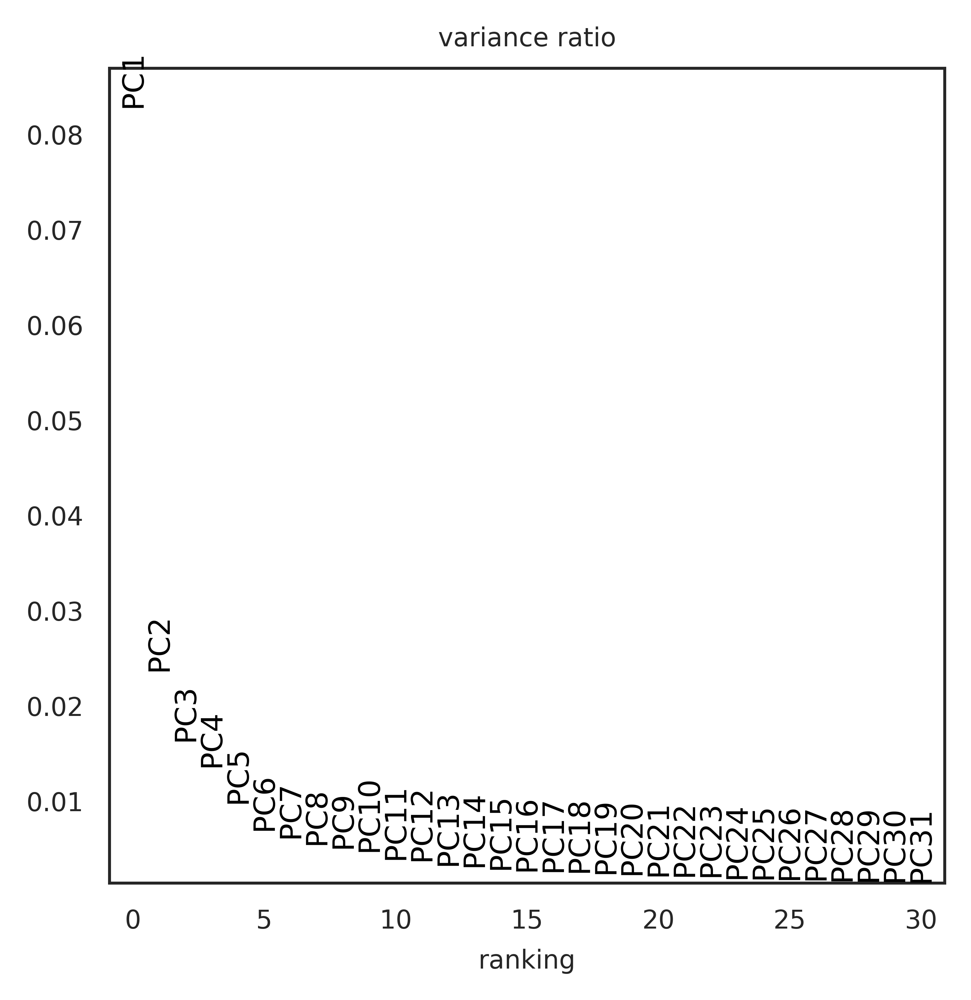

computing neighbors
    using 'X_pca' with n_pcs = 57
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)


In [17]:
number_of_PC_used = calculate_optimal_PC(adata, min_PC = 50, min_var=25, n_comps=100, use_hv=None)
sc.pp.neighbors(adata, n_neighbors=10, method= 'umap', n_pcs=number_of_PC_used,random_state=0)

In [18]:
#subset to TAM
if subset_adata:
    adata = adata[adata.obs['annotation_SPADE_1']==subset]

In [19]:
if recalculate_embeddings:
    #select optimal number of PCs and recalculate PCs
    #number_of_PC_used = calculate_optimal_PC(adata, min_PC = 50, min_var=25, n_comps=100, use_hv=None)
    #recalculate FDL
    #np.random.seed(1000)
    #sc.pp.neighbors(adata, n_neighbors=10, method= 'umap', n_pcs=number_of_PC_used,random_state=0)
    sc.tl.diffmap(adata, n_comps=15, neighbors_key=None,  copy=False,random_state=8)
    

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.989353   0.981774   0.9787793  0.9757552  0.9691519
     0.96624327 0.9652192  0.96151257 0.9538846  0.95144147 0.94778866
     0.9428794  0.93947226 0.938257  ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:02)


In [20]:
adata_copy = adata.copy()

In [21]:
#adata = adata_copy.copy()

In [22]:
if subset_patients:
    adata = adata[adata.obs[patient_subset_obs]==patient_subset_key]

In [23]:
adata

AnnData object with n_obs × n_vars = 12132 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

In [24]:
adata.obs['patient'] = adata.obs['Bassez_patient_id'].copy()
adata.obs['sample_id'] = adata.obs['batch'].copy()
#adata.obs['primary-site'] = adata.obs['Sample ID'].map(metadata_df_primary_site_dict)
#adata.obs['sample_type'] = adata.obs['Sample ID'].map(metadata_df_sample_type_dict)
adata.obs['independent_variable'] = adata.obs['Bassez_timepoint'].copy()
adata.obs['expansion'] = adata.obs['Bassez_expansion'].copy()
#adata.obs['tumor-site'] = adata.obs['Sample ID'].map(metadata_df_site_dict)

In [25]:
set(adata.obs['expansion'] )

{'E', 'NE', 'nan'}

In [26]:
set(adata.obs['independent_variable'])

{'On', 'Pre'}

In [27]:
#remove nans

adata = adata[adata.obs['expansion']!='nan']
adata

View of AnnData object with n_obs × n_vars = 11644 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'phen

In [28]:
#adjust variable to make sure fold change is in the correct direction
adata.obs['independent_variable'] =adata.obs['independent_variable'].map({'On':'1','Pre':'0'})
adata.obs['expansion'] =adata.obs['expansion'].map({'NE':'0','E':'1'})

Trying to set attribute `.obs` of view, copying.


In [29]:
adata

AnnData object with n_obs × n_vars = 11644 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

In [30]:
#add processing date batch information
#adata.obs['confounding_variable'] = adata.obs['treatment'].copy()
#set(adata.obs['confounding_variable'])

## recalculate PCs and embeddings

This is because we have subsetted the data to samples of interest (in this case only T3 and T4 samples)

In [31]:
adata

AnnData object with n_obs × n_vars = 11644 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

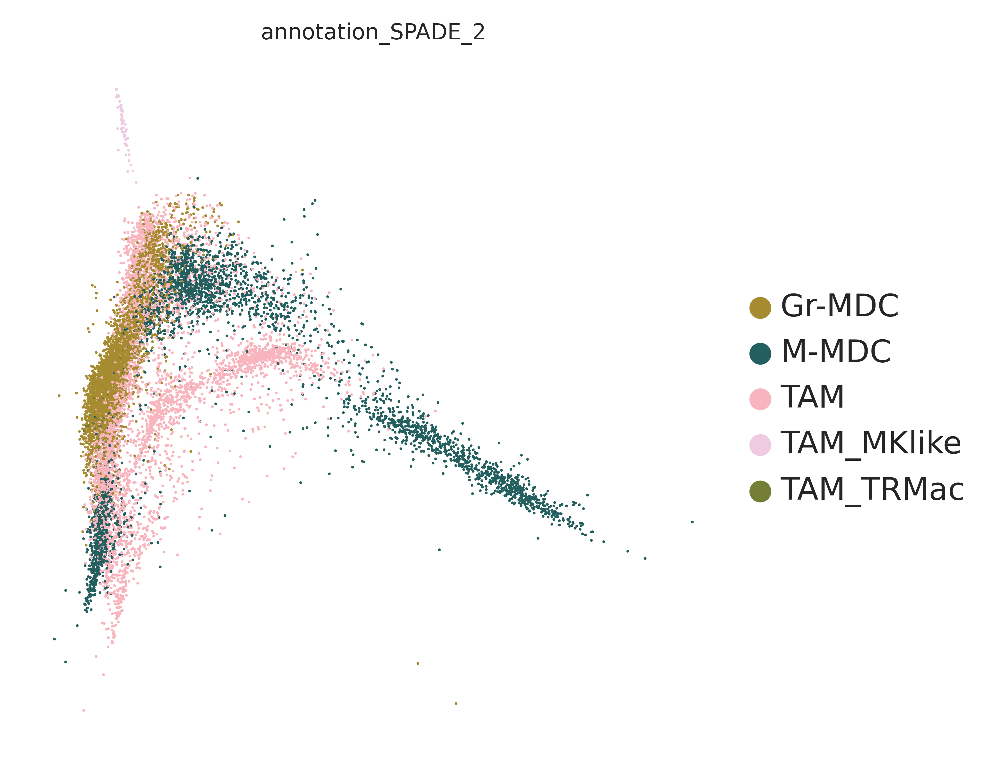

In [32]:
sc.pl.diffmap(adata, color = ['annotation_SPADE_2'], s = 3, components='2,4', palette= batlow_20,cmap='Spectral_r', legend_fontsize = 10, vmin=0)

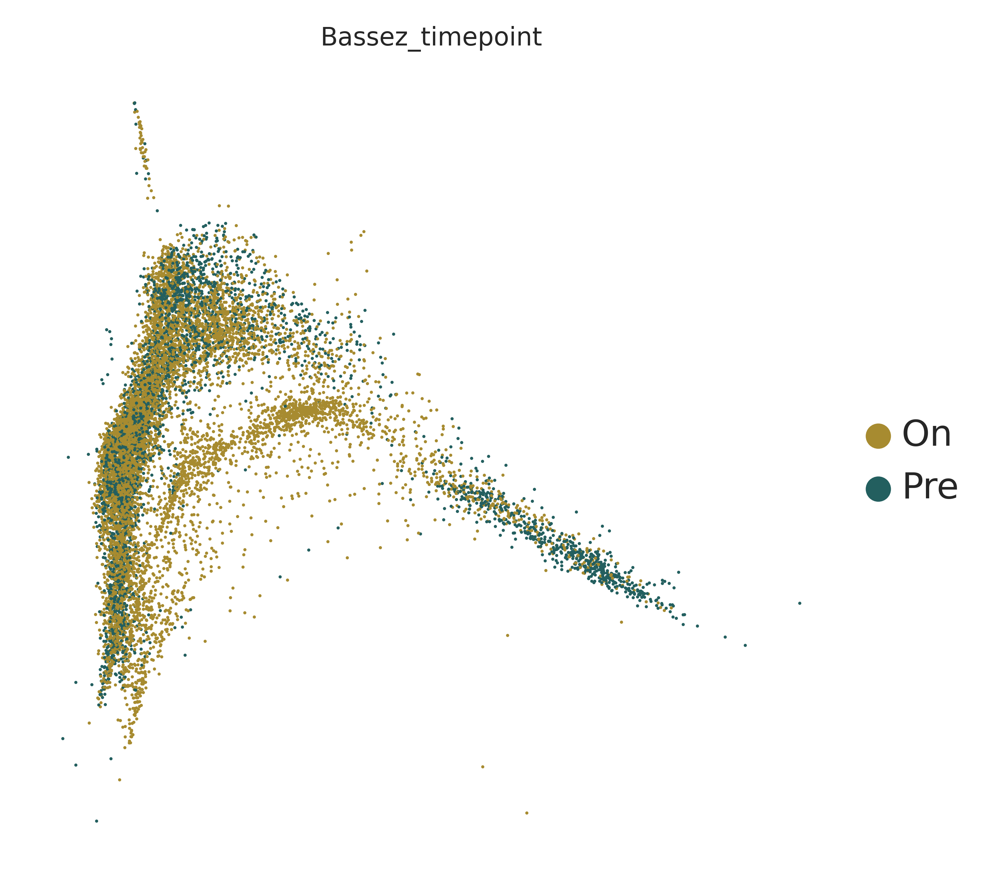

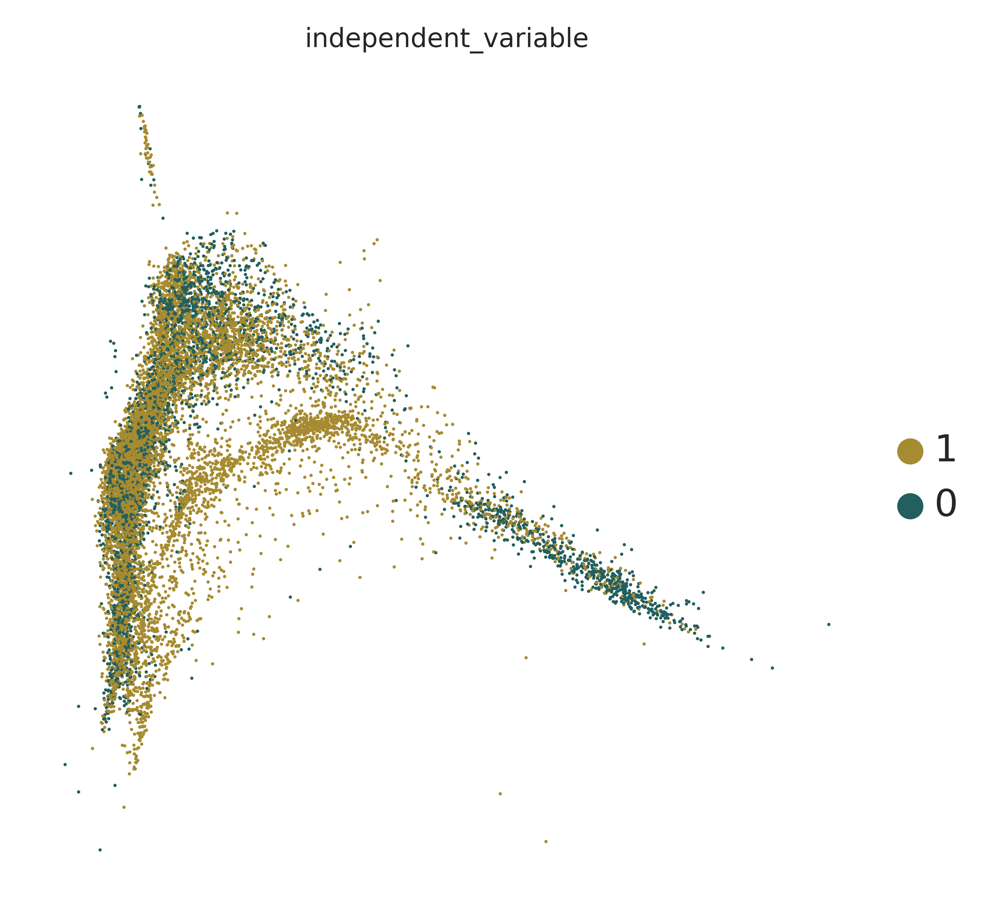

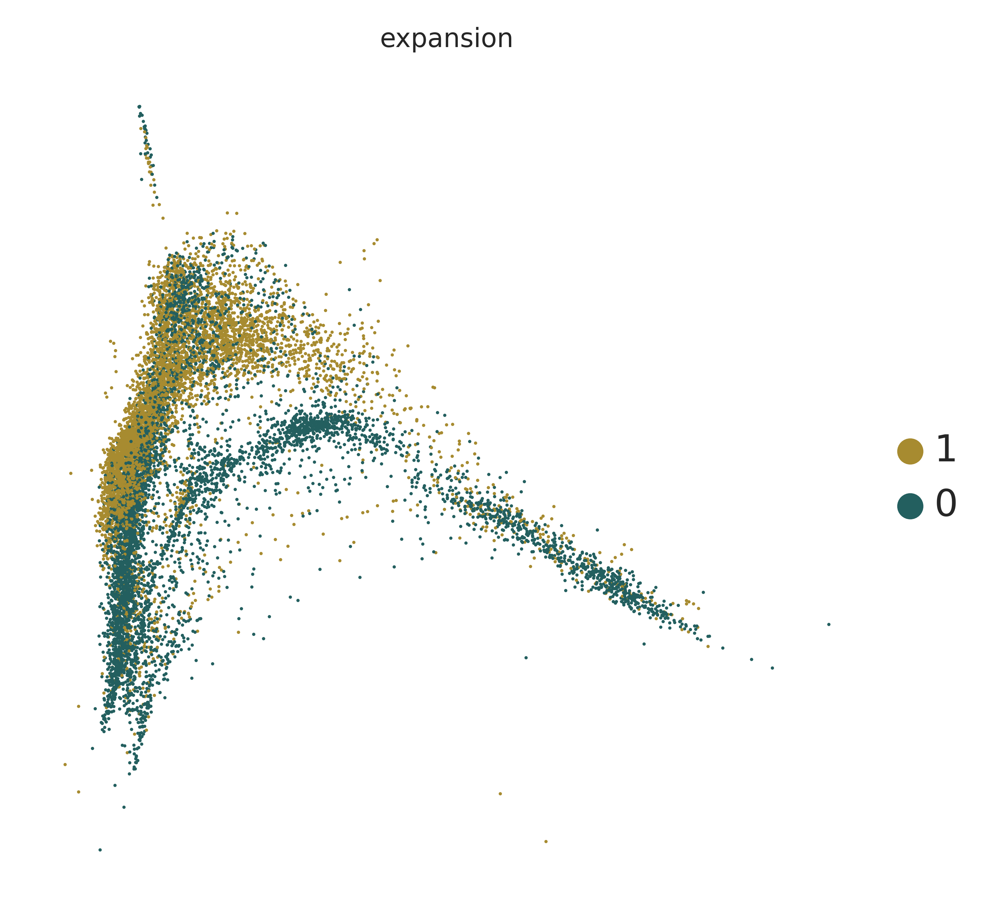

In [33]:
sc.pl.diffmap(adata, color = ['Bassez_timepoint'], s = 3, components='2,4', palette= batlow_20,cmap='Spectral_r', legend_fontsize = 10, vmin=0)
sc.pl.diffmap(adata, color = ['independent_variable'], s = 3, components='2,4', palette= batlow_20,cmap='Spectral_r', legend_fontsize = 10, vmin=0)
sc.pl.diffmap(adata, color = ['expansion'], s = 3, components='2,4', palette= batlow_20,cmap='Spectral_r', legend_fontsize = 10, vmin=0)


In [34]:
adata

AnnData object with n_obs × n_vars = 11644 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

In [35]:
adata.obs[['independent_variable','expansion']]

,independent_variable,expansion
JUQ026_AAAGCAAAGTCTCCTC-1,0,1
JUQ026_AAAGCAATCGGAAACG-1,0,1
JUQ026_AACTGGTTCAACACAC-1,0,1
JUQ026_ACACTGAAGATCCCGC-1,0,1
JUQ026_ACACTGACAGCATGAG-1,0,1
...,...,...
JUQ124_TGCCCTATCAGGTAAA-1,1,0
JUQ124_TGCGCAGAGGCAGGTT-1,1,0
JUQ124_TTAGGACGTCTCTCGT-1,1,0
JUQ124_TTAGTTCCATCCCACT-1,1,0


# Milo

## Make Milo object

To start with, we have to convert our anndata object back into a SingleCellExperiment. The `anndata2ri` converter doesn't seem to like converting anndata objects storing the KNN graph in the `adata.obsp` slot, probably because there is no dedicated slot in the `SingleCellExperiment` object. Because of this, we will first make a copy of our `anndata` without KNN graph for conversion.

define your output data directory (this is where we will store the adjacency matrices for each neighborhood later)

In [36]:
#remove neighbors
adata_no_knn = adata.copy()
adata_no_knn.obsp = None
adata_no_knn.uns.pop("neighbors")
adata_no_knn

AnnData object with n_obs × n_vars = 11644 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

In [37]:
adata_no_knn

AnnData object with n_obs × n_vars = 11644 × 19984
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'cohort', 'total_molecules', 'ID', 'age_rounded_up', 'postmenopause', 'TNM_version', 'T_prefix', 'T', 'T_suffix', 'N_prefix', 'N', 'N_suffix', 'M_prefix', 'M', 'M_suffix', 'HER2', 'ER', 'PR', 'CTX', 'KI67_precent_range_prePD1', 'KI67_precent_range_postPD1', 'TCR_clonotype_expansion', 'Bassez_nCount_RNA', 'Bassez_nFeature_RNA', 'Bassez_patient_id', 'Bassez_timepoint', 'Bassez_expansion', 'Bassez_BC_type', 'Bassez_cellType', 'Bassez_cellSubType', 'n_genes', 'percent_mito', 'n_counts', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k2

In [38]:
#anndata2ri has difficulty with some .obs so let's reduce them to the minimum we need
adata_no_knn.obs = pd.DataFrame(adata_no_knn.obs[['patient','sample_id','independent_variable','expansion']])
adata_no_knn.obs

,patient,sample_id,independent_variable,expansion
JUQ026_AAAGCAAAGTCTCCTC-1,JUQ026_JUQ027,JUQ026,0,1
JUQ026_AAAGCAATCGGAAACG-1,JUQ026_JUQ027,JUQ026,0,1
JUQ026_AACTGGTTCAACACAC-1,JUQ026_JUQ027,JUQ026,0,1
JUQ026_ACACTGAAGATCCCGC-1,JUQ026_JUQ027,JUQ026,0,1
JUQ026_ACACTGACAGCATGAG-1,JUQ026_JUQ027,JUQ026,0,1
...,...,...,...,...
JUQ124_TGCCCTATCAGGTAAA-1,JUQ123_JUQ124,JUQ124,1,0
JUQ124_TGCGCAGAGGCAGGTT-1,JUQ123_JUQ124,JUQ124,1,0
JUQ124_TTAGGACGTCTCTCGT-1,JUQ123_JUQ124,JUQ124,1,0
JUQ124_TTAGTTCCATCCCACT-1,JUQ123_JUQ124,JUQ124,1,0


In [39]:
#select relevant data and create new anndata object, anndata2ri has problems with indices otherwise
adata_no_knn = anndata.AnnData(X=adata_no_knn.X, obs=adata_no_knn.obs, var=adata_no_knn.var, uns=None, obsm=adata_no_knn.obsm, 
                              varm=None, layers=None, raw=None, dtype='float32', 
                              shape=None, filename=None, filemode=None, asview=False, obsp=None, varp=None, oidx=None, vidx=None)
adata_no_knn

AnnData object with n_obs × n_vars = 11644 × 19984
    obs: 'patient', 'sample_id', 'independent_variable', 'expansion'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_tsne', 'X_umap'

This can be converted to a `SingleCellExperiment` using R magic again

In [40]:
%%R -i adata_no_knn
adata_no_knn

class: SingleCellExperiment 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(5): DM X_draw_graph_fa PCA TSNE UMAP
mainExpName: NULL
altExpNames(0):


And we can make a Milo class object for DA analysis

In [41]:
%%R 
milo <- Milo(adata_no_knn)
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(5): DM X_draw_graph_fa PCA TSNE UMAP
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(0):
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1


## add KNN graph

recompute the KNN graph using the dedicated function in `miloR`. 
the is also a way to use the knn graph calculated in python in the Milo tutorial but transfer to R did not work in this case

In [42]:
%%R 
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(5): DM X_draw_graph_fa PCA TSNE UMAP
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(0):
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1


In [43]:
#how many Pcs does your data have
num_PCs = adata_no_knn.obsm['X_pca'].shape[1]
print('number of PCs in adata is:',num_PCs)

number of PCs in adata is: 57


In [44]:
%%R -i num_PCs
num_PCs

[1] 57


%%R 
milo <- buildGraph(milo, k=20, d=num_PCs,
  transposed = TRUE,
  get.distance = FALSE,
  reduced.dim = "PCA"
)


In [45]:
%%R 
milo <- buildGraph(milo, k=50, d=num_PCs,
  transposed = TRUE,
  get.distance = FALSE,
  reduced.dim = "PCA"
)


In [46]:
%%R
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(5): DM X_draw_graph_fa PCA TSNE UMAP
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(1): graph
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1


## Run Milo regression : interaction term

The last variable in the regression formula will be the independent variable for which a fold change and spatial FDR will be calculated. Here we extract the fold change and FDR for the interaction term timepoint*expansion

In [47]:
print(1)

1


In [48]:
%%R
dir = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/'
OUT_RESULT_DIR = paste0(dir, 'milo_PrevsOn_allcells_M_prevson_interaction_NRfold/')


In [49]:
dir = '/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/'
OUT_RESULT_DIR = dir + 'milo_PrevsOn_allcells_M_prevson_interaction_NRfold/'

In [50]:
%%R
print(OUT_RESULT_DIR)

[1] "/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/milo_PrevsOn_allcells_M_prevson_interaction_NRfold/"


In [52]:
design_df

,patient,sample_id,independent_variable,expansion
sample_id,,,,
JUQ026,JUQ026_JUQ027,JUQ026,0,1
JUQ027,JUQ026_JUQ027,JUQ027,1,1
JUQ033,JUQ033_JUQ036,JUQ033,0,1
JUQ036,JUQ033_JUQ036,JUQ036,1,1
JUQ039,JUQ039_JUQ041,JUQ039,0,0
...,...,...,...,...
JUQ111,JUQ109_JUQ111,JUQ111,1,0
JUQ110,JUQ110_JUQ112,JUQ110,0,0
JUQ112,JUQ110_JUQ112,JUQ112,1,0


In [53]:
adata.obs["independent_variable"] = adata.obs["independent_variable"].astype(int)
adata.obs["expansion"] = adata.obs["expansion"].astype(int)

In [54]:
#define dataframe to input in milo (at least cells x independent variable)
design_df = adata.obs[["patient",'sample_id', "independent_variable", "expansion"]]
design_df.drop_duplicates(inplace=True)
design_df.index = design_df['sample_id']
design_df['interaction']= design_df['independent_variable']*design_df['expansion']
design_df

/home/wallet/miniconda3/envs/2021_Peer_Milo_jupyter_2/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)
/scratch/lsftmp/8050290.tmpdir/ipykernel_12952/2603646547.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  design_df['interaction']= design_df['independent_variable']*design_df['expansion']


,patient,sample_id,independent_variable,expansion,interaction
sample_id,,,,,
JUQ026,JUQ026_JUQ027,JUQ026,0,1,0
JUQ027,JUQ026_JUQ027,JUQ027,1,1,1
JUQ033,JUQ033_JUQ036,JUQ033,0,1,0
JUQ036,JUQ033_JUQ036,JUQ036,1,1,1
JUQ039,JUQ039_JUQ041,JUQ039,0,0,0
...,...,...,...,...,...
JUQ111,JUQ109_JUQ111,JUQ111,1,0,0
JUQ110,JUQ110_JUQ112,JUQ110,0,0,0
JUQ112,JUQ110_JUQ112,JUQ112,1,0,0


In [55]:
design_df = design_df[~design_df['independent_variable'].isna()]
design_df = design_df[~design_df['expansion'].isna()]

In [56]:
design_df

,patient,sample_id,independent_variable,expansion,interaction
sample_id,,,,,
JUQ026,JUQ026_JUQ027,JUQ026,0,1,0
JUQ027,JUQ026_JUQ027,JUQ027,1,1,1
JUQ033,JUQ033_JUQ036,JUQ033,0,1,0
JUQ036,JUQ033_JUQ036,JUQ036,1,1,1
JUQ039,JUQ039_JUQ041,JUQ039,0,0,0
...,...,...,...,...,...
JUQ111,JUQ109_JUQ111,JUQ111,1,0,0
JUQ110,JUQ110_JUQ112,JUQ110,0,0,0
JUQ112,JUQ110_JUQ112,JUQ112,1,0,0


Then we just copy the steps from the package vignettes. Again, we need to give the design dataframe in input to the R chunk, and ask for the dataframe storing differential abundance results as output. 

In [90]:
%%R -i design_df -o DA_results
## Define neighbourhoods

milo <- makeNhoods(milo, prop = 0.1, k = 50, d=num_PCs, refined = TRUE)

## Count cells in neighbourhoods
milo <- countCells(milo, meta.data = data.frame(colData(milo)), sample="sample_id")

## Calculate distances between cells in neighbourhoods
## for spatial FDR correction
milo <- calcNhoodDistance(milo, d=num_PCs)

## Test for differential abundance set ~ <confounding_variable>  + <independent variable>

DA_results <- testNhoods(milo, design = ~ independent_variable + expansion + interaction ,
                         design.df = design_df)


In [91]:
%%R -o test
test <- as.matrix(nhoodCounts(milo))

In [92]:
test.shape

(844, 79)

In [93]:
%%R
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(5): DM X_draw_graph_fa PCA TSNE UMAP
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 11644 844
nhoodCounts dimensions(2): 844 79
nhoodDistances dimension(1): 844
graph names(1): graph
nhoodIndex names(1): 844
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1


In [96]:
DA_results.sort_values('FDR')

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
412,8.618580,12.203757,3.176310e+01,2.031119e-07,0.000171,412.0,0.000167
369,-8.246532,12.315887,2.529718e+01,1.333098e-06,0.000434,369.0,0.000429
659,-7.388455,12.290731,2.484007e+01,1.543149e-06,0.000434,659.0,0.000429
487,-7.452682,12.715491,2.197109e+01,5.708291e-06,0.001204,487.0,0.000954
815,5.751971,12.235411,1.892336e+01,2.599651e-05,0.004388,815.0,0.003649
...,...,...,...,...,...,...,...
177,0.816438,12.842122,2.109705e-01,6.466035e-01,0.999853,177.0,0.999853
496,1.175524,12.321175,1.017560e+00,9.046172e-01,0.999853,496.0,0.999853
494,-4.603684,12.180317,4.657533e-07,9.995646e-01,0.999853,494.0,0.999853
207,1.162258,11.904557,1.923373e-07,9.996705e-01,0.999853,207.0,0.999853


Text(0, 0.5, '- log10(Spatial FDR)')

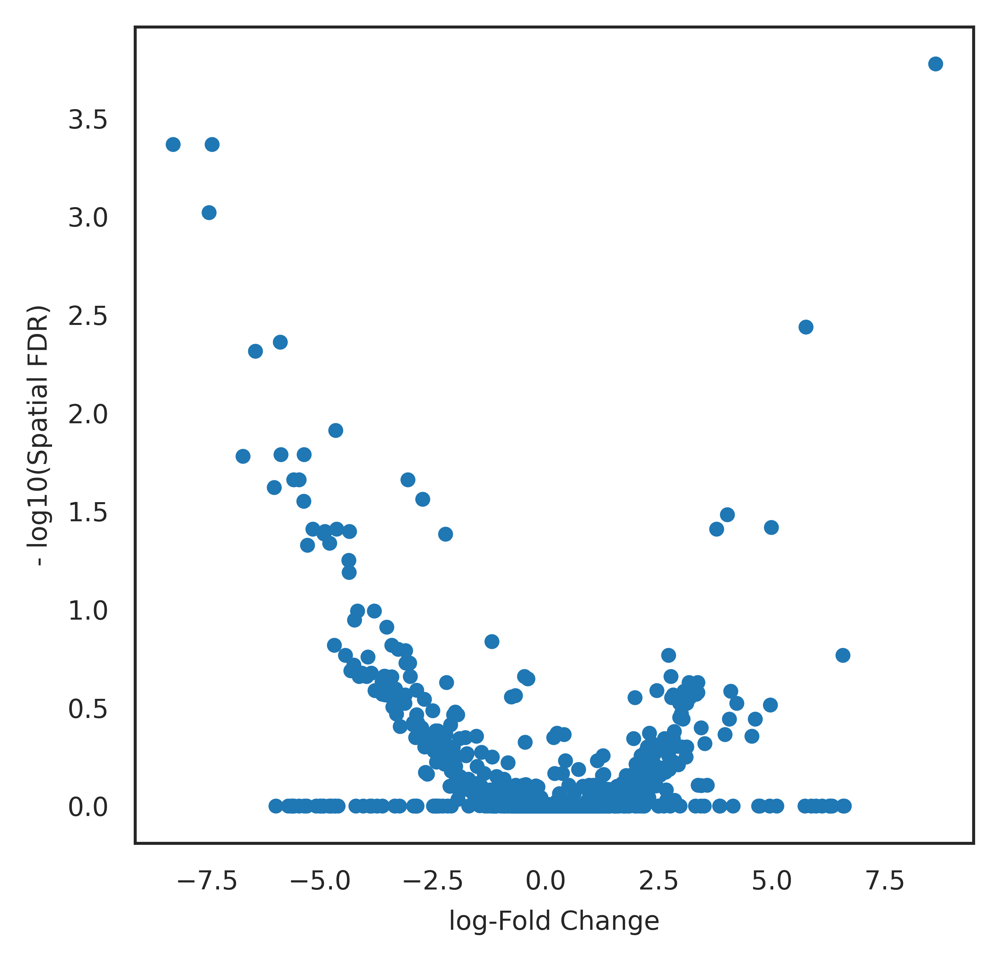

In [98]:
#inspect fold change and FDR in a volcano plot
plt.plot(DA_results.logFC, -np.log10(DA_results.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)")

### Visualizing results from Milo analysis

To visualize DA results and relate them to the single-cell embedding, we build an abstracted graph of connecting neighbourhoods that have cells in common. This is implemented in the `buildNhoodGraph` function (shouldn't be too difficult to do a python implementation of this).

In [99]:
%%R
milo <- buildNhoodGraph(milo)
library(ggplot2)

In [100]:
%%R
install.packages('ggthemes')

--- Please select a CRAN mirror for use in this session ---
Secure CRAN mirrors 

 1: 0-Cloud [https]
 2: Australia (Canberra) [https]
 3: Australia (Melbourne 1) [https]
 4: Australia (Melbourne 2) [https]
 5: Australia (Perth) [https]
 6: Austria [https]
 7: Belgium (Brussels) [https]
 8: Brazil (PR) [https]
 9: Brazil (RJ) [https]
10: Brazil (SP 1) [https]
11: Brazil (SP 2) [https]
12: Bulgaria [https]
13: Canada (MB) [https]
14: Canada (ON 3) [https]
15: Chile (Santiago) [https]
16: China (Beijing 2) [https]
17: China (Beijing 3) [https]
18: China (Hefei) [https]
19: China (Hong Kong) [https]
20: China (Guangzhou) [https]
21: China (Lanzhou) [https]
22: China (Nanjing) [https]
23: China (Shanghai 2) [https]
24: China (Shenzhen) [https]
25: Colombia (Cali) [https]
26: Costa Rica [https]
27: Cyprus [https]
28: Czech Republic [https]
29: Denmark [https]
30: East Asia [https]
31: Ecuador (Cuenca) [https]
32: Ecuador (Quito) [https]
33: France (Lyon 1) [https]
34: France (Lyon 2) [https

* installing *source* package ‘ggthemes’ ...
** package ‘ggthemes’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** data
*** moving datasets to lazyload DB
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (ggthemes)


In [101]:
%%R
library(ggthemes)

In [102]:
%%R
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(5): DM X_draw_graph_fa PCA TSNE UMAP
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 11644 844
nhoodCounts dimensions(2): 844 79
nhoodDistances dimension(1): 844
graph names(1): graph
nhoodIndex names(1): 844
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 844 844


In [103]:
%%R
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(5): DM X_draw_graph_fa PCA TSNE UMAP
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 11644 844
nhoodCounts dimensions(2): 844 79
nhoodDistances dimension(1): 844
graph names(1): graph
nhoodIndex names(1): 844
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 844 844


To visualize the graph, you have again multiple options. The first one is to just use the functionalities implemented in the `miloR` package in another R chunk.

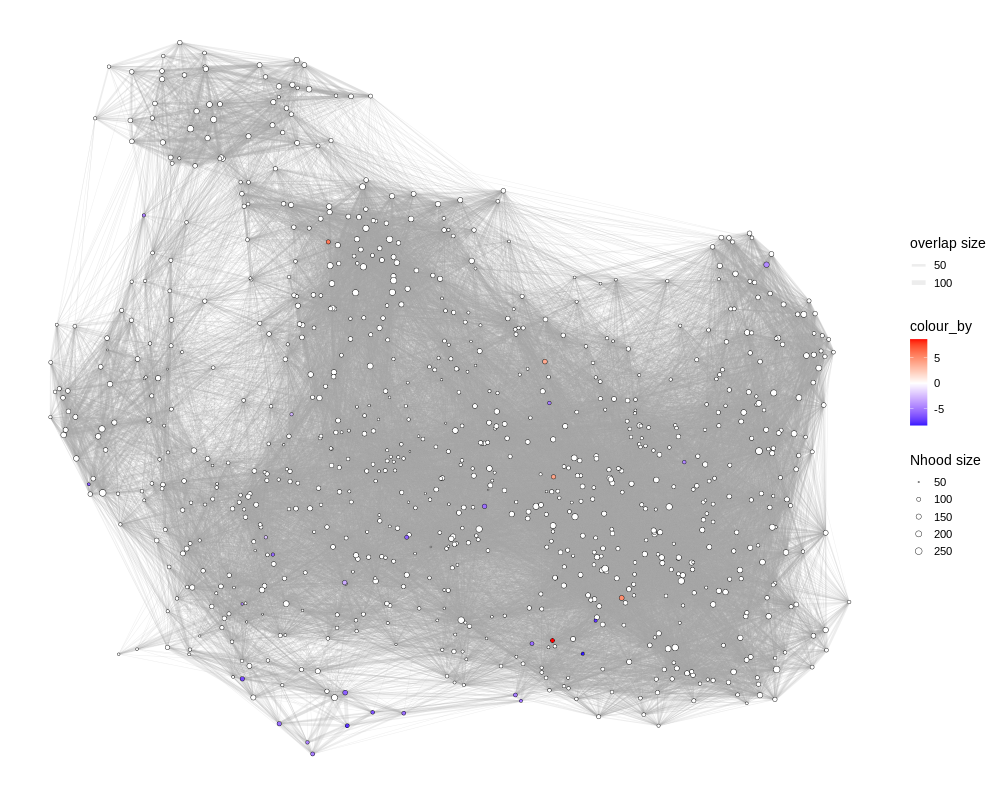

In [107]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=0.1, res_column='logFC', layout='UMAP')
#palette_heatmap <- ggthemes_data$tableau$`color-palettes`$`ordered-diverging`$`Red-Blue Diverging`$value %>% rev()
#palette_heatmap = colorRampPalette(palette_heatmap)(20)
g + scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red') #+ geom_point(aes(size = )) #neighbor size
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

In [120]:
%%R
reducedDims(milo)$DM_mod <- reducedDims(milo)$DM[,c(2,4)]

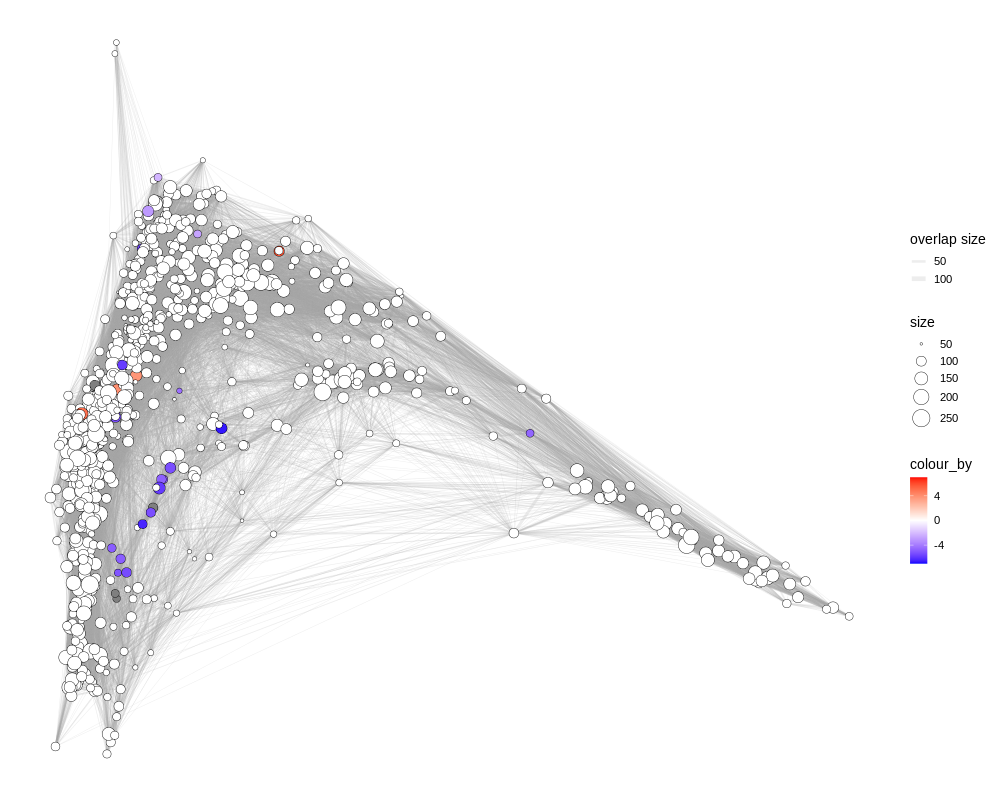

In [121]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=0.05, res_column='logFC', layout='DM_mod')
g + scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

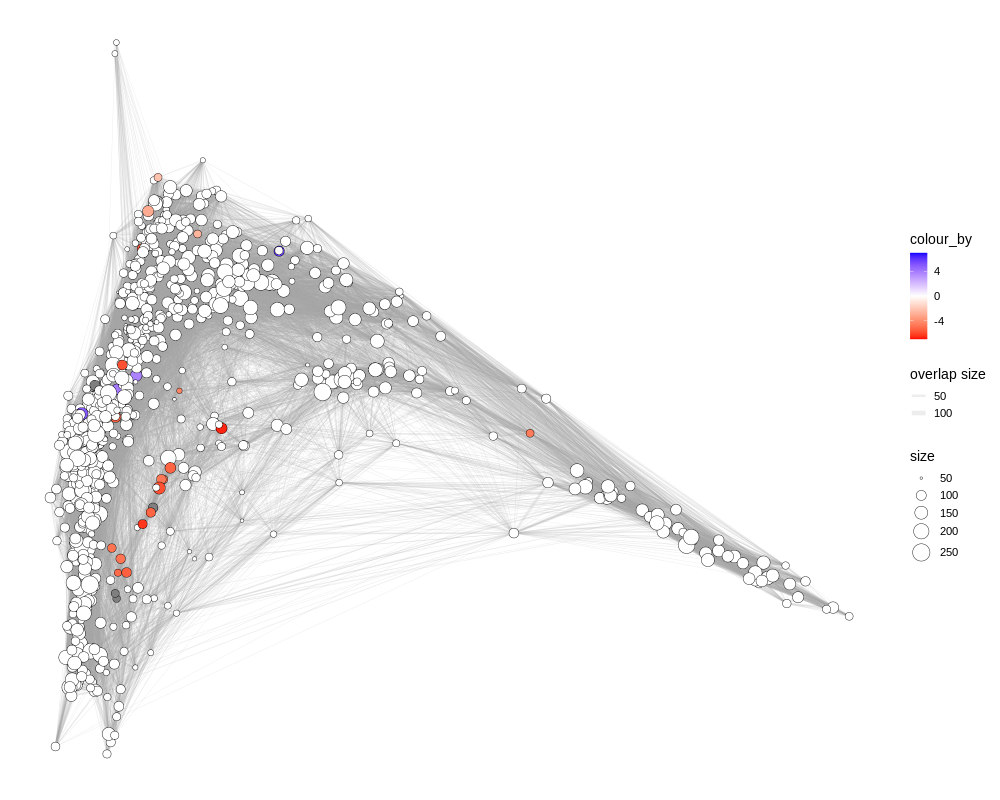

In [122]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=0.05, res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'red', mid = 'white', high = 'blue',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

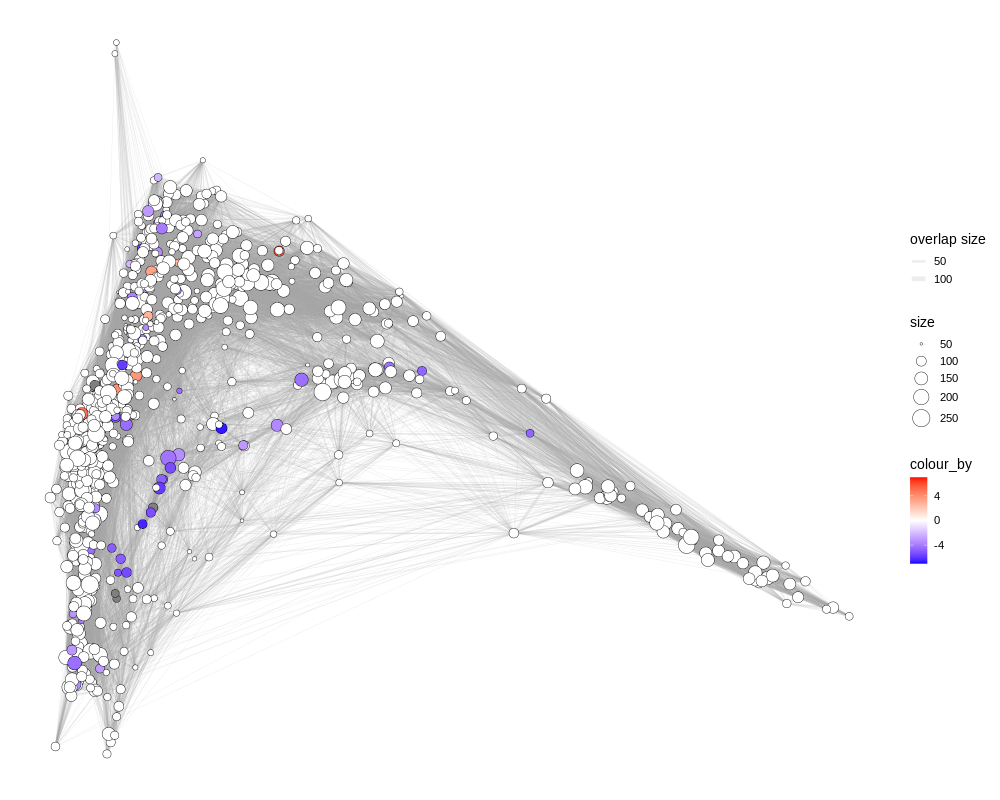

In [123]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=.25, res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

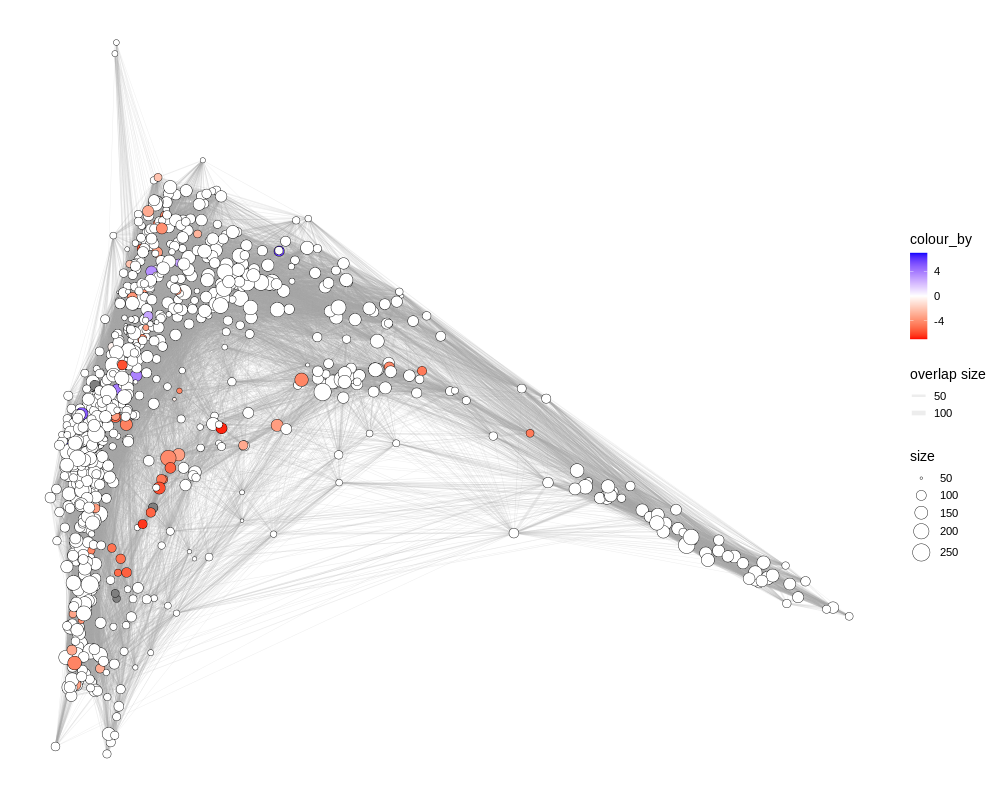

In [124]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=.25, res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'red', mid = 'white', high = 'blue',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

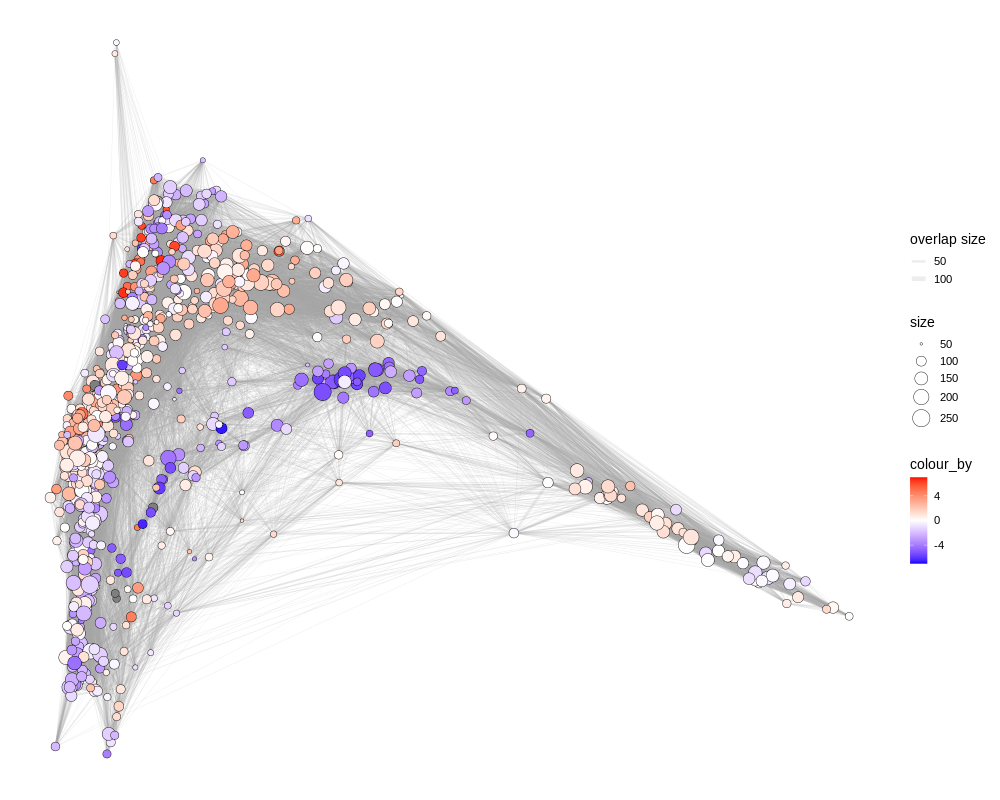

In [125]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results,   alpha=1,res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

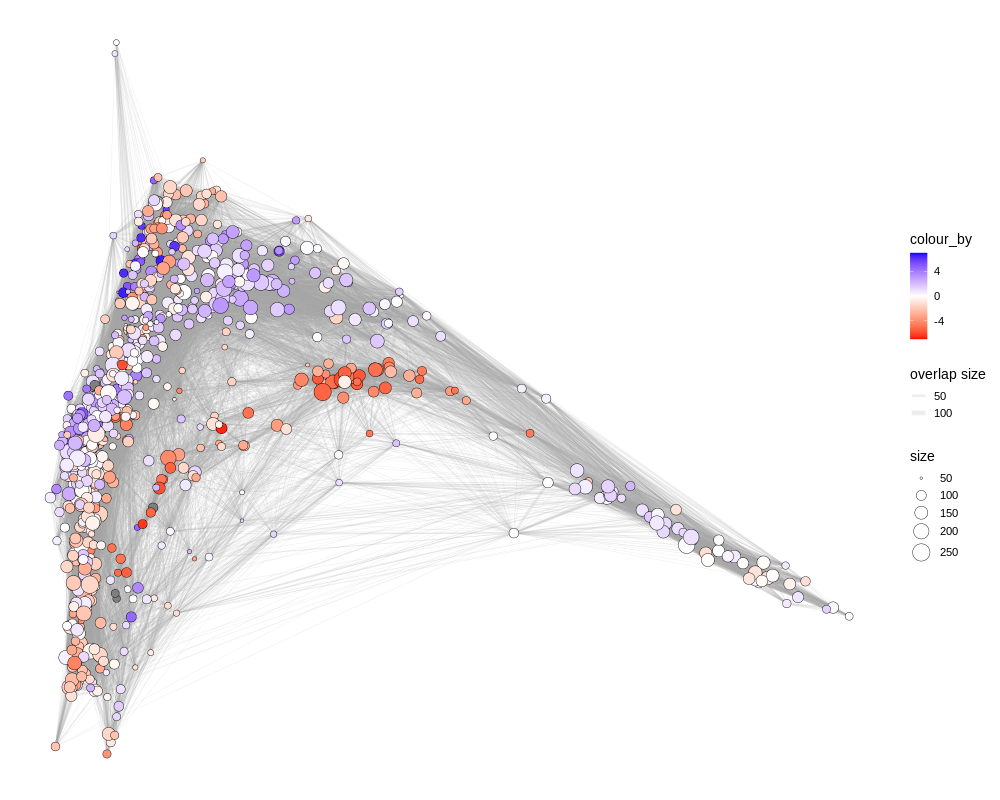

In [126]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results,  alpha=1,res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'red', mid = 'white', high = 'blue',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

Otherwise, If you can't take any more R, then you can make an `anndata` object for the neighbourhoods, storing the abstracted graph in the `obsp` slot.
<-- comment TW I didn't find this very helpful bc it doesnt give you the assignment which cells belong to which neighborhood. We'll extract this info below

In [127]:
%%R -o nhood_graph
## Save the adjacency matrix of the nhood graph
nhood_graph = as_adjacency_matrix(nhoodGraph(milo), attr="weight")

In [128]:
%%R -o nhood_graph_indices

##save the indices of the adjacency matrix

nhood_graph_indices = names(nhoodDistances(milo))

In [129]:
%%R -o nh_umap_df
## Save the positions in UMAP of nhood indices
nh_umap_df = reducedDim(milo, "UMAP")[unlist(nhoodIndex(milo)),]
nh_tsne_df = reducedDim(milo, "TSNE")[unlist(nhoodIndex(milo)),]

In [130]:
%%R -o nh_tsne_df
## Save the positions in tsne of nhood indices
nh_tsne_df = reducedDim(milo, "TSNE")[unlist(nhoodIndex(milo)),]

In [131]:
nhood_adata = anndata.AnnData(obs = DA_results)
nhood_adata

AnnData object with n_obs × n_vars = 844 × 0
    obs: 'logFC', 'logCPM', 'F', 'PValue', 'FDR', 'Nhood', 'SpatialFDR'

In [132]:
## Add graph
nhood_graph_conn = nhood_graph.copy()
nhood_graph_conn[nhood_graph_conn > 1] = 1 
nhood_adata.obs_names = nhood_graph_indices
nhood_adata.uns["neighbors"] = {}
nhood_adata.obsp['distances'] = nhood_graph
nhood_adata.uns['neighbors']["distances"] = nhood_graph
nhood_adata.obsp['connectivities'] = nhood_graph_conn
nhood_adata.uns['neighbors']["connectivities"] = nhood_graph_conn

/scratch/lsftmp/8050290.tmpdir/ipykernel_12952/725290890.py:7: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  nhood_adata.uns['neighbors']["distances"] = nhood_graph
/scratch/lsftmp/8050290.tmpdir/ipykernel_12952/725290890.py:9: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  nhood_adata.uns['neighbors']["connectivities"] = nhood_graph_conn


In [133]:
## Add umap positions
nhood_adata.obsm["X_umap"] = nh_umap_df
nhood_adata.obsm["X_tsne"] = nh_tsne_df

In [134]:
#save data
nhood_adata.write(adata_neigh_save_path)
print('saved data to:',adata_neigh_save_path)

saved data to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/data/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_M_reembedded_neigh_prevson_NEE_interaction_NRfold.h5ad


In [135]:
%%R

for(i in 1:length(nhoodDistances(milo))) {
  write.csv(as.matrix(nhoodDistances(milo)[[i]]),
            paste0(OUT_RESULT_DIR,'milo.nhoodDistances_',names(nhoodDistances(milo)[i]),'.csv'))
}


here you see the real names of the milo neighborhoods

In [136]:
%%R
names(nhoodDistances(milo))

  [1] "5117"  "505"   "912"   "9950"  "2976"  "7517"  "1039"  "1463"  "1787" 
 [10] "3646"  "5680"  "356"   "5846"  "6216"  "776"   "7569"  "9537"  "6313" 
 [19] "5881"  "4218"  "7884"  "8604"  "1827"  "9648"  "6791"  "616"   "7388" 
 [28] "10119" "1054"  "1434"  "9072"  "1412"  "4193"  "7420"  "1224"  "8767" 
 [37] "8721"  "5120"  "2937"  "1321"  "10658" "1436"  "10103" "5658"  "10561"
 [46] "1179"  "10767" "7229"  "10057" "10274" "10940" "8955"  "1253"  "1440" 
 [55] "7368"  "9342"  "2356"  "1019"  "1202"  "6804"  "2725"  "7497"  "1934" 
 [64] "4954"  "5491"  "887"   "2153"  "10012" "853"   "4608"  "5792"  "7522" 
 [73] "10066" "3355"  "8647"  "3343"  "10550" "5615"  "5070"  "502"   "545"  
 [82] "1299"  "10402" "2000"  "2136"  "3432"  "8709"  "1433"  "1698"  "2556" 
 [91] "3666"  "3189"  "4387"  "8516"  "3130"  "8887"  "3017"  "8871"  "765"  
[100] "1864"  "2901"  "3883"  "3966"  "2996"  "1533"  "5093"  "5025"  "2335" 
[109] "6090"  "5087"  "6718"  "9985"  "8375"  "5431"  "1254"  "9

In [137]:
%%R
print(OUT_RESULT_DIR)

[1] "/data/peer/wallet/Jupyter/SPADE_Peer_validation/data/milo_PrevsOn_allcells_M_prevson_interaction_NRfold/"


## Milo regression: timepoint term

The last variable in the regression formula will be the independent variable for which a fold change and spatial FDR will be calculated. Here we extract the fold change and FDR for the interaction term timepoint term

In [1]:
#define dataframe to input in milo (at least cells x independent variable)
design_df = adata.obs[["patient",'sample_id', "independent_variable", "expansion"]]
design_df.drop_duplicates(inplace=True)
design_df.index = design_df['sample_id']
design_df['interaction']= design_df['independent_variable']*design_df['expansion']
design_df

NameError: name 'adata' is not defined

In [139]:
design_df = design_df[~design_df['independent_variable'].isna()]
design_df = design_df[~design_df['expansion'].isna()]

In [140]:
design_df

,patient,sample_id,independent_variable,expansion,interaction
sample_id,,,,,
JUQ026,JUQ026_JUQ027,JUQ026,0,1,0
JUQ027,JUQ026_JUQ027,JUQ027,1,1,1
JUQ033,JUQ033_JUQ036,JUQ033,0,1,0
JUQ036,JUQ033_JUQ036,JUQ036,1,1,1
JUQ039,JUQ039_JUQ041,JUQ039,0,0,0
...,...,...,...,...,...
JUQ111,JUQ109_JUQ111,JUQ111,1,0,0
JUQ110,JUQ110_JUQ112,JUQ110,0,0,0
JUQ112,JUQ110_JUQ112,JUQ112,1,0,0


Then we just copy the steps from the package vignettes. Again, we need to give the design dataframe in input to the R chunk, and ask for the dataframe storing differential abundance results as output. 

In [142]:
%%R -i design_df -o DA_results
## Define neighbourhoods

milo <- makeNhoods(milo, prop = 0.1, k = 50, d=num_PCs, refined = TRUE)

## Count cells in neighbourhoods
milo <- countCells(milo, meta.data = data.frame(colData(milo)), sample="sample_id")

## Calculate distances between cells in neighbourhoods
## for spatial FDR correction
milo <- calcNhoodDistance(milo, d=num_PCs)

## Test for differential abundance set ~ <confounding_variable>  + <independent variable>

DA_results <- testNhoods(milo, design = ~  expansion + interaction + independent_variable ,

                         design.df = design_df)


In [143]:
%%R -o test
test <- as.matrix(nhoodCounts(milo))

In [144]:
test.shape

(858, 79)

In [145]:
%%R
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(6): DM X_draw_graph_fa ... UMAP DM_mod
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 11644 858
nhoodCounts dimensions(2): 858 79
nhoodDistances dimension(1): 858
graph names(1): graph
nhoodIndex names(1): 858
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 844 844


inspect the exported result dataframe in python containing the log fold change and 
false discovery rates computed by milo. Min that every row is a cell and NOT a neighborhood. Also for some unknown reason the indices of the dataframe are NOT the names of the neighborhood. We will export the neighbor-
hood names from R below, which is important for visualizing these in python.

In [146]:
DA_results.sort_values('FDR')

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
66,4.724776,12.040608,40.035320,3.396999e-09,5.845953e-07,66.0,6.055703e-07
435,5.506092,12.362547,39.696883,4.694371e-09,5.845953e-07,435.0,6.055703e-07
201,5.348858,12.476929,40.325728,2.095586e-09,5.845953e-07,201.0,6.055703e-07
140,4.878433,12.249257,38.005434,5.450772e-09,5.845953e-07,140.0,6.055703e-07
337,5.787610,12.704897,38.995032,4.826801e-09,5.845953e-07,337.0,6.055703e-07
...,...,...,...,...,...,...,...
135,-0.455244,12.034203,0.550973,9.665039e-01,1.000000e+00,135.0,1.000000e+00
741,-0.043777,12.061921,0.000053,9.941766e-01,1.000000e+00,741.0,1.000000e+00
399,0.000000,11.919078,0.000000,1.000000e+00,1.000000e+00,399.0,1.000000e+00
322,-0.057814,12.160065,0.002708,9.585597e-01,1.000000e+00,322.0,1.000000e+00


Text(0, 0.5, '- log10(Spatial FDR)')

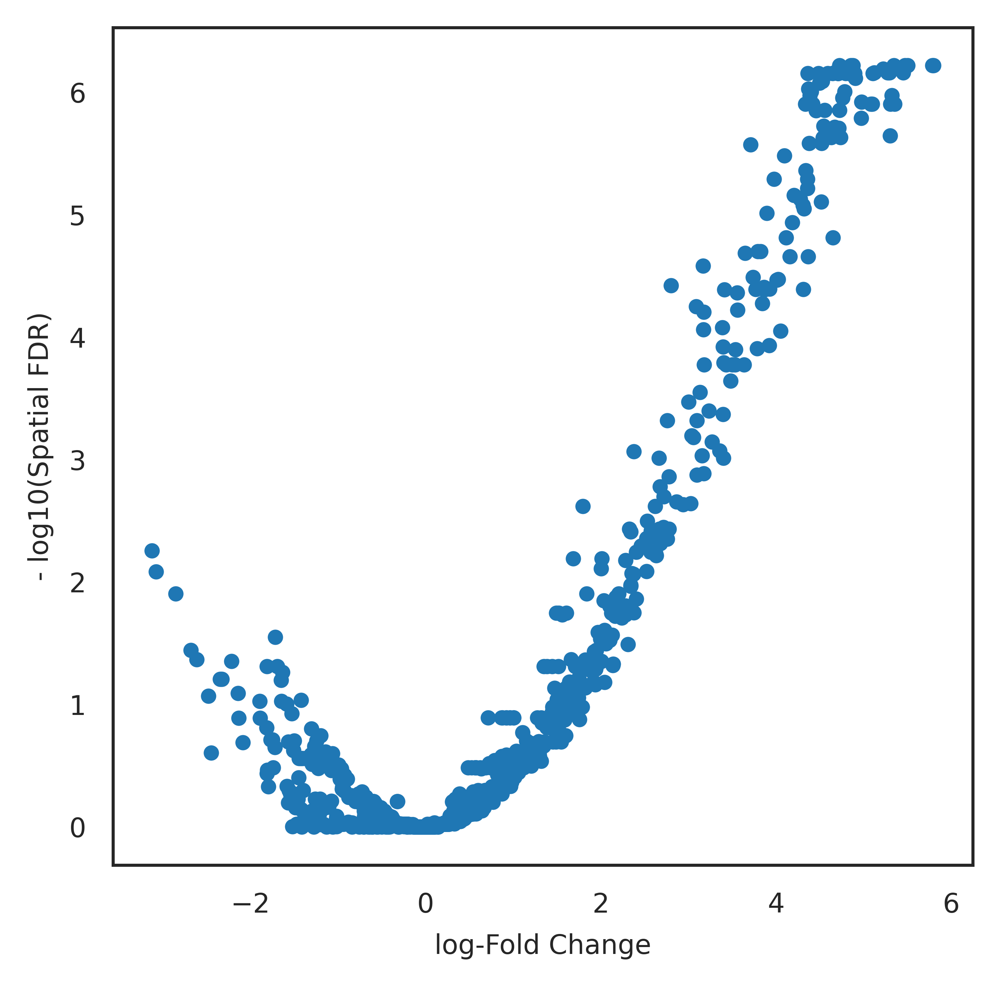

In [147]:
#inspect fold change and FDR in a volcano plot
plt.plot(DA_results.logFC, -np.log10(DA_results.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)")

### Visualizing results from Milo analysis

To visualize DA results and relate them to the single-cell embedding, we build an abstracted graph of connecting neighbourhoods that have cells in common. This is implemented in the `buildNhoodGraph` function (shouldn't be too difficult to do a python implementation of this).

In [148]:
%%R
milo <- buildNhoodGraph(milo)
library(ggplot2)

In [149]:
%%R
install.packages('ggthemes')

* installing *source* package ‘ggthemes’ ...
** package ‘ggthemes’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** data
*** moving datasets to lazyload DB
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (ggthemes)


In [150]:
%%R
library(ggthemes)

In [151]:
%%R
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(6): DM X_draw_graph_fa ... UMAP DM_mod
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 11644 858
nhoodCounts dimensions(2): 858 79
nhoodDistances dimension(1): 858
graph names(1): graph
nhoodIndex names(1): 858
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 858 858


In [152]:
%%R
milo

class: Milo 
dim: 19984 11644 
metadata(0):
assays(1): X
rownames(19984): UBTF KCNC3 ... SLC35A1 ZC3H7B
rowData names(11): n_cells_by_counts mean_counts ... variances
  variances_norm
colnames(11644): JUQ026_AAAGCAAAGTCTCCTC-1 JUQ026_AAAGCAATCGGAAACG-1
  ... JUQ124_TTAGTTCCATCCCACT-1 JUQ124_TTTACTGCACGGTGTC-1
colData names(4): patient sample_id independent_variable expansion
reducedDimNames(6): DM X_draw_graph_fa ... UMAP DM_mod
mainExpName: NULL
altExpNames(0):
nhoods dimensions(2): 11644 858
nhoodCounts dimensions(2): 858 79
nhoodDistances dimension(1): 858
graph names(1): graph
nhoodIndex names(1): 858
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 858 858


To visualize the graph, you have again multiple options. The first one is to just use the functionalities implemented in the `miloR` package in another R chunk.

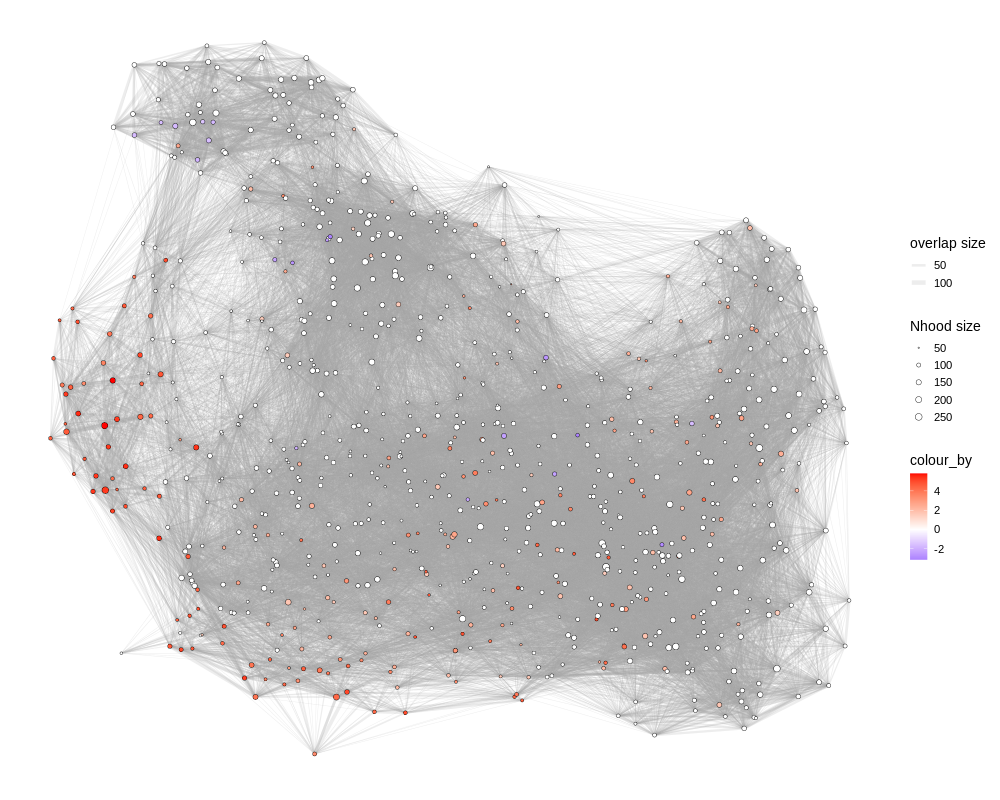

In [153]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=0.1, res_column='logFC', layout='UMAP')
#palette_heatmap <- ggthemes_data$tableau$`color-palettes`$`ordered-diverging`$`Red-Blue Diverging`$value %>% rev()
#palette_heatmap = colorRampPalette(palette_heatmap)(20)
g + scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red') #+ geom_point(aes(size = )) #neighbor size
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

In [154]:
%%R
reducedDims(milo)$DM_mod <- reducedDims(milo)$DM[,c(2,4)]

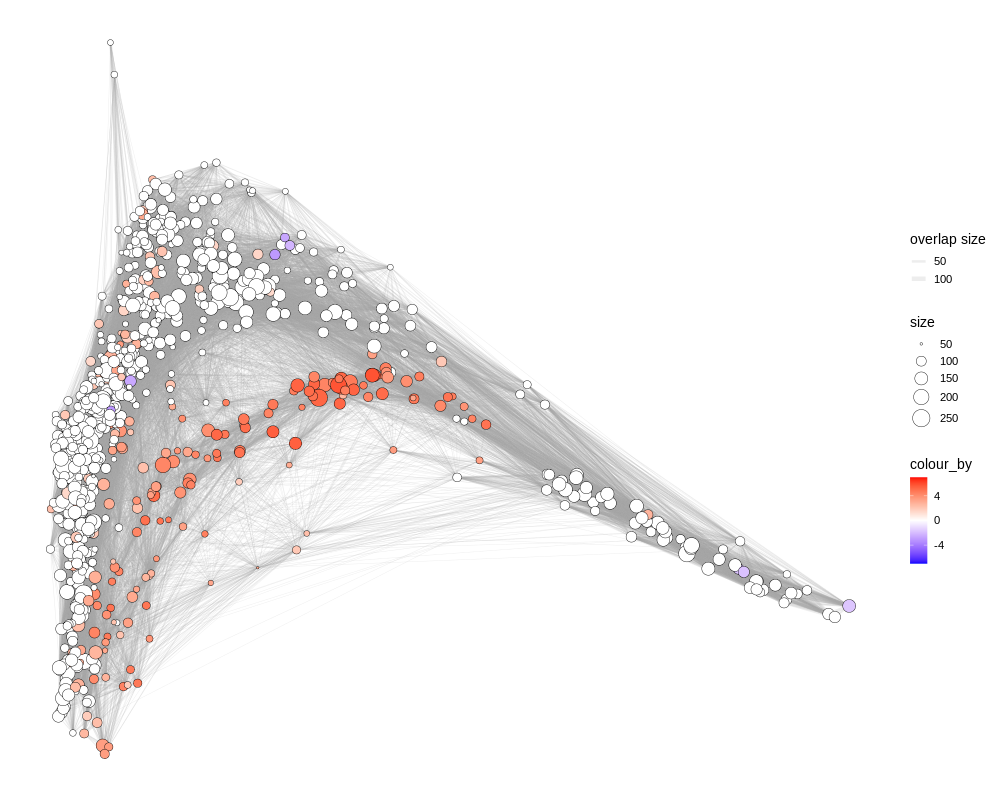

In [155]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=0.05, res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

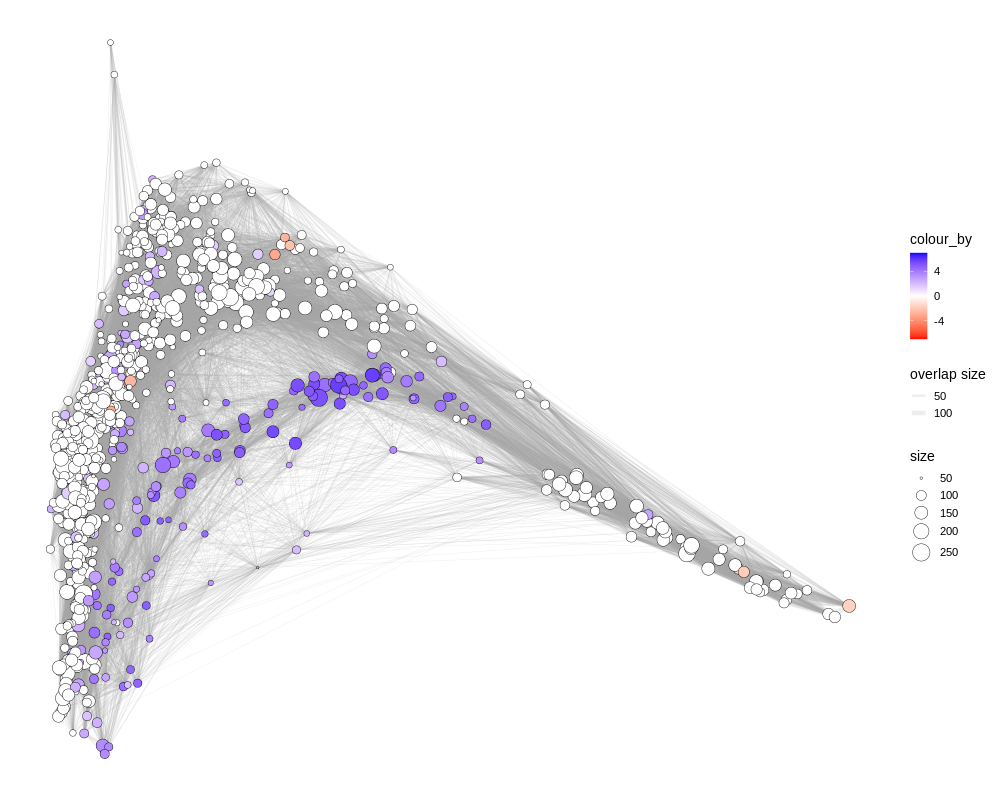

In [156]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=0.05, res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'red', mid = 'white', high = 'blue',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

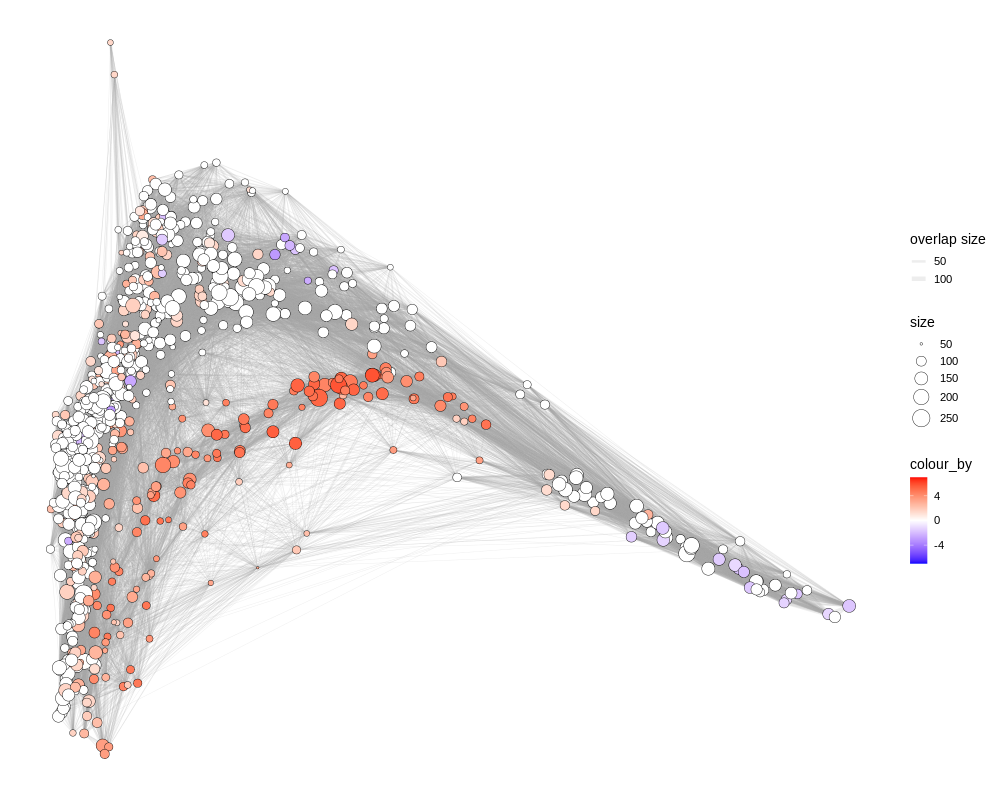

In [157]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=.25, res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

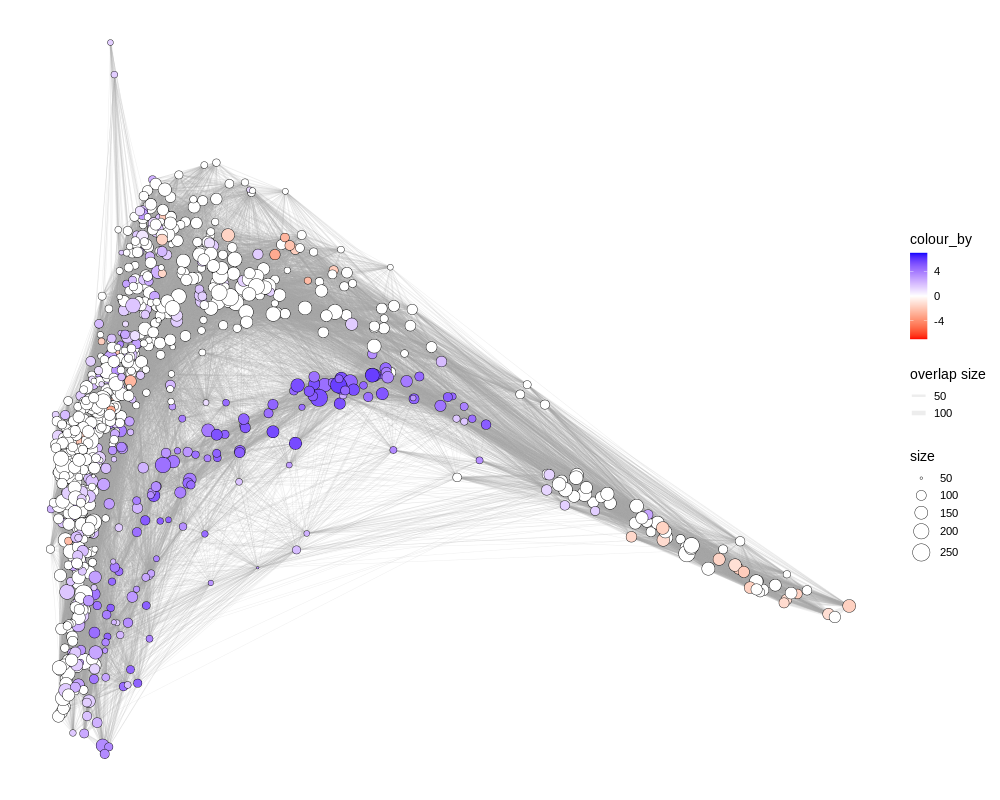

In [158]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results, alpha=.25, res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'red', mid = 'white', high = 'blue',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

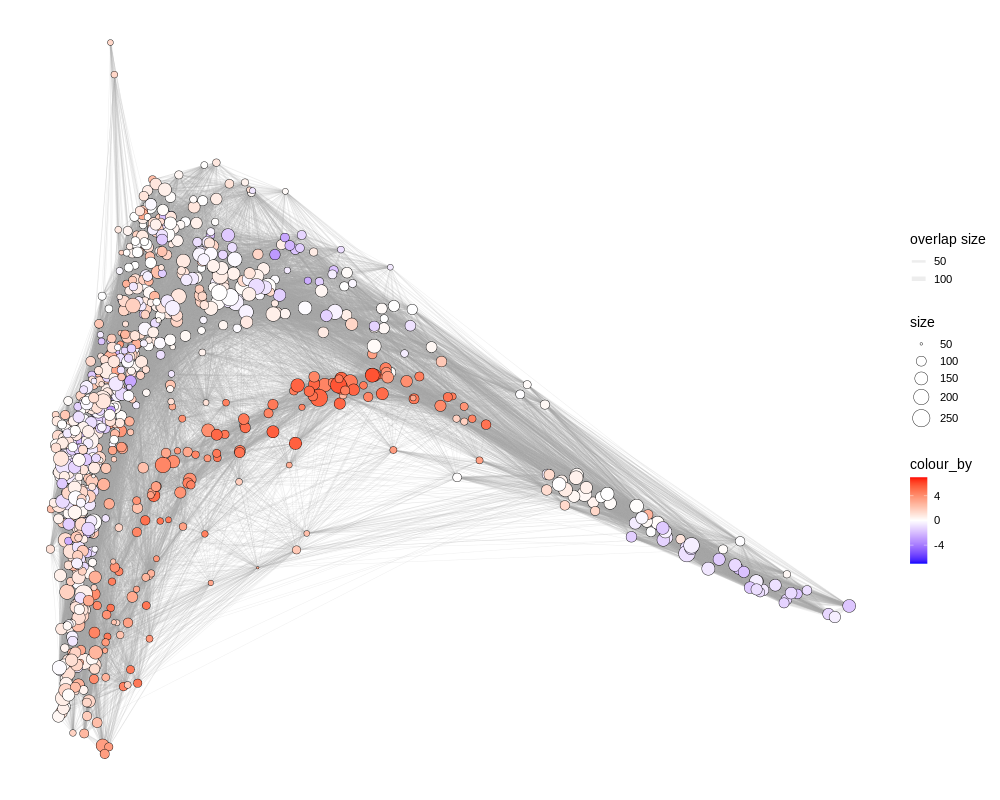

In [159]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results,   alpha=1,res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'blue', mid = 'white', high = 'red',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

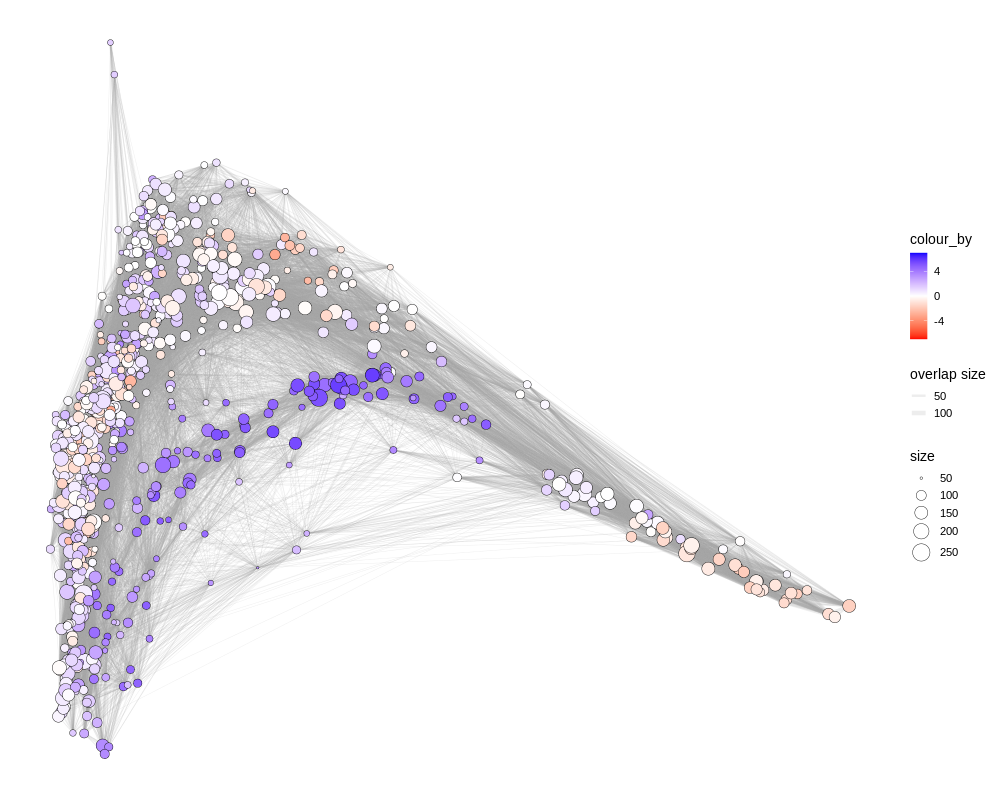

In [160]:
%%R -w 1000 -h 800
g <- plotNhoodGraphDA(milo, DA_results,  alpha=1,res_column='logFC', layout='DM_mod')
g +scale_size_continuous(range = c(1,8))  + scale_fill_gradient2(low = 'red', mid = 'white', high = 'blue',
                        limits=c(-7,7)) #+ geom_point(aes(size = )) #neighbor size+scale_size(range = c(2,4) 
#this attempt to change color did not work:
#g+scale_color_gradient(low="blue", high="red")
#mid<-mean(milo$logFC)
#g + scale_color_gradient2(midpoint=mid, low="blue", mid="white",
                #     high="red", space ="Lab" )

Otherwise, If you can't take any more R, then you can make an `anndata` object for the neighbourhoods, storing the abstracted graph in the `obsp` slot.
<-- comment TW I didn't find this very helpful bc it doesnt give you the assignment which cells belong to which neighborhood. We'll extract this info below

In [161]:
%%R -o nhood_graph
## Save the adjacency matrix of the nhood graph
nhood_graph = as_adjacency_matrix(nhoodGraph(milo), attr="weight")

In [162]:
%%R -o nhood_graph_indices

##save the indices of the adjacency matrix

nhood_graph_indices = names(nhoodDistances(milo))

In [163]:
%%R -o nh_umap_df
## Save the positions in UMAP of nhood indices
nh_umap_df = reducedDim(milo, "UMAP")[unlist(nhoodIndex(milo)),]
nh_tsne_df = reducedDim(milo, "TSNE")[unlist(nhoodIndex(milo)),]

In [164]:
%%R -o nh_tsne_df
## Save the positions in tsne of nhood indices
nh_tsne_df = reducedDim(milo, "TSNE")[unlist(nhoodIndex(milo)),]

In [165]:
nhood_adata = anndata.AnnData(obs = DA_results)
nhood_adata

AnnData object with n_obs × n_vars = 858 × 0
    obs: 'logFC', 'logCPM', 'F', 'PValue', 'FDR', 'Nhood', 'SpatialFDR'

In [166]:
## Add graph
nhood_graph_conn = nhood_graph.copy()
nhood_graph_conn[nhood_graph_conn > 1] = 1 
nhood_adata.obs_names = nhood_graph_indices
nhood_adata.uns["neighbors"] = {}
nhood_adata.obsp['distances'] = nhood_graph
nhood_adata.uns['neighbors']["distances"] = nhood_graph
nhood_adata.obsp['connectivities'] = nhood_graph_conn
nhood_adata.uns['neighbors']["connectivities"] = nhood_graph_conn

/scratch/lsftmp/8050290.tmpdir/ipykernel_12952/725290890.py:7: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  nhood_adata.uns['neighbors']["distances"] = nhood_graph
/scratch/lsftmp/8050290.tmpdir/ipykernel_12952/725290890.py:9: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  nhood_adata.uns['neighbors']["connectivities"] = nhood_graph_conn


In [167]:
## Add umap positions
nhood_adata.obsm["X_umap"] = nh_umap_df
nhood_adata.obsm["X_tsne"] = nh_tsne_df

In [168]:
#save data
nhood_adata.write(adata_neigh_save_path_2)
print('saved data to:',adata_neigh_save_path_2)

saved data to: /data/peer/wallet/Jupyter/SPADE_Peer_validation/data/BRCA-X-TIL-X-Bassez_2021-X-cohort1_2_annotated_211208_cell-type-spec_global0.01_delta_0.001_beta_0.0_pseudo_0.0_50PC_M_reembedded_neigh_prevson_NEE_interaction_NRfold_2.h5ad
